### 🔮 Prediction (comparison with and without applying PCA)

In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns

from sklearn import metrics, svm
from sklearn.cluster import DBSCAN, MiniBatchKMeans, Birch, OPTICS, cluster_optics_dbscan, AgglomerativeClustering, SpectralClustering, KMeans
from sklearn.datasets import load_digits
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, roc_curve, confusion_matrix
from sklearn.metrics.cluster import v_measure_score, silhouette_score
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D

from scipy.cluster.hierarchy import linkage, dendrogram
from scipy.spatial.distance import cdist

import time

In [2]:
# Personalized functions:

def testModel(test,y_test,model):
    y_predicted = model.predict(test)
    print(classification_report(y_test, y_predicted))
    print("Accuracy: ", round(accuracy_score(y_test,  y_predicted), 2), "%")


### 💾 Load data

In [3]:
digits = load_digits()
digits

{'data': array([[ 0.,  0.,  5., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ..., 10.,  0.,  0.],
        [ 0.,  0.,  0., ..., 16.,  9.,  0.],
        ...,
        [ 0.,  0.,  1., ...,  6.,  0.,  0.],
        [ 0.,  0.,  2., ..., 12.,  0.,  0.],
        [ 0.,  0., 10., ..., 12.,  1.,  0.]]),
 'target': array([0, 1, 2, ..., 8, 9, 8]),
 'target_names': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]),
 'images': array([[[ 0.,  0.,  5., ...,  1.,  0.,  0.],
         [ 0.,  0., 13., ..., 15.,  5.,  0.],
         [ 0.,  3., 15., ..., 11.,  8.,  0.],
         ...,
         [ 0.,  4., 11., ..., 12.,  7.,  0.],
         [ 0.,  2., 14., ..., 12.,  0.,  0.],
         [ 0.,  0.,  6., ...,  0.,  0.,  0.]],
 
        [[ 0.,  0.,  0., ...,  5.,  0.,  0.],
         [ 0.,  0.,  0., ...,  9.,  0.,  0.],
         [ 0.,  0.,  3., ...,  6.,  0.,  0.],
         ...,
         [ 0.,  0.,  1., ...,  6.,  0.,  0.],
         [ 0.,  0.,  1., ...,  6.,  0.,  0.],
         [ 0.,  0.,  0., ..., 10.,  0.,  0.]],
 
        [[ 0

In [4]:
# Let's keep the data and the labels:
data = digits.images
labels = digits.target_names

In [5]:
# Checking that total number of samples coincides with total number of labels:
print(len(digits.target))
len(data)

1797


1797

### ✂️ Divide train and test

In [6]:
X = data
y = digits.target
X.shape

(1797, 8, 8)

In [7]:
# We need to reshape the arrays:
X = X.reshape(1797, 64)

In [8]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)

In [9]:
print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
y_test.shape

(1203, 64)
(1203,)
(594, 64)


(594,)

#### Train and test SVM model

In [10]:
clf = svm.SVC(gamma='scale', decision_function_shape='ovo')
clf.fit(x_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovo', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [11]:
testModel(x_test,y_test, clf)

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        63
           1       0.95      1.00      0.98        59
           2       1.00      1.00      1.00        55
           3       1.00      0.99      0.99        68
           4       0.99      1.00      0.99        66
           5       0.96      0.98      0.97        52
           6       1.00      1.00      1.00        54
           7       1.00      0.98      0.99        62
           8       0.96      0.96      0.96        51
           9       0.97      0.94      0.95        64

    accuracy                           0.98       594
   macro avg       0.98      0.98      0.98       594
weighted avg       0.98      0.98      0.98       594

Accuracy:  0.98 %


### 📏 Dimensionality Reduction (PCA 🆚 LDA)
*   PCA
*   LDA




#### Principal Component Analysis | PCA

In [12]:
# Let's set 30 components:
pca = PCA(n_components = 30)
pca.fit(X)
pca_data = pca.transform(X)

In [13]:
pca_data.shape

(1797, 30)

In [14]:
pca.explained_variance_ 

array([179.0069301 , 163.71774688, 141.78843909, 101.1003752 ,
        69.51316559,  59.10852489,  51.88453911,  44.01510667,
        40.31099529,  37.0117984 ,  28.51904118,  27.3211698 ,
        21.90148806,  21.32435652,  17.63672221,  16.9468634 ,
        15.85138978,  15.00446004,  12.23447272,  10.88685025,
        10.6935521 ,   9.58255905,   9.22636518,   8.69032678,
         8.36535435,   7.16567911,   6.91931624,   6.18942573,
         5.88430495,   5.15540077])

In [15]:
print(np.sum(pca.explained_variance_ratio_))

0.9590807417439425


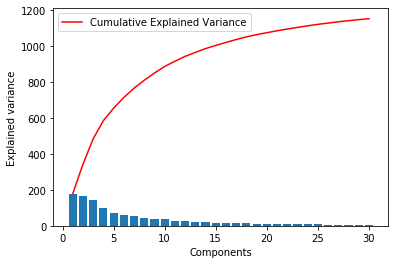

In [16]:
plt.bar(range(1,len(pca.explained_variance_ratio_ )+1),pca.explained_variance_ )
plt.ylabel('Explained variance')
plt.xlabel('Components')
plt.plot(range(1,len(pca.explained_variance_ )+1),
         np.cumsum(pca.explained_variance_),
         c='red',
         label="Cumulative Explained Variance")
plt.legend(loc='upper left')

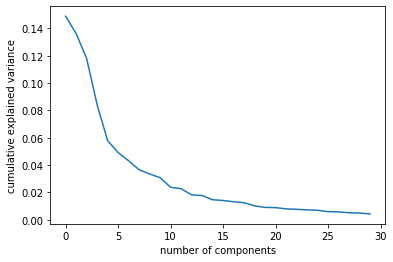

array([0.14890594, 0.13618771, 0.11794594, 0.08409979, 0.05782415,
       0.0491691 , 0.04315987, 0.03661373, 0.03353248, 0.03078806,
       0.02372341, 0.02272697, 0.01821863, 0.01773855, 0.01467101,
       0.01409716, 0.01318589, 0.01248138, 0.01017718, 0.00905617,
       0.00889537, 0.0079712 , 0.0076749 , 0.007229  , 0.00695867,
       0.00596073, 0.0057558 , 0.00514864, 0.00489483, 0.00428849])

In [17]:
plt.plot(pca.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

pca.explained_variance_ratio_

In [18]:
# Splitting 30 component data:
x_train, x_test, y_train, y_test = train_test_split(pca_data, y, test_size=0.33, random_state=1)

In [19]:
clf.fit(x_train, y_train)
y_pred = clf.predict(x_test)

In [20]:
confusion_matrix(y_test, y_pred)

array([[63,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 58,  0,  0,  0,  0,  0,  0,  1,  0],
       [ 0,  0, 55,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  1, 67,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 66,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 51,  0,  0,  0,  1],
       [ 0,  0,  0,  0,  0,  0, 54,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 61,  0,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 50,  1],
       [ 0,  0,  0,  0,  0,  2,  0,  0,  1, 61]])

In [21]:
testModel(x_test,y_test, clf)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        63
           1       1.00      0.98      0.99        59
           2       0.98      1.00      0.99        55
           3       1.00      0.99      0.99        68
           4       1.00      1.00      1.00        66
           5       0.96      0.98      0.97        52
           6       1.00      1.00      1.00        54
           7       1.00      0.98      0.99        62
           8       0.96      0.98      0.97        51
           9       0.95      0.95      0.95        64

    accuracy                           0.99       594
   macro avg       0.99      0.99      0.99       594
weighted avg       0.99      0.99      0.99       594

Accuracy:  0.99 %


### Let's try with 3 components instead of 30 to visualize!

In [22]:
pca_3 = PCA(n_components = 3)
pca_3.fit(X)
principalComponents_3 = pca_3.transform(X)

In [23]:
principalComponents_3

array([[ -1.25946639,  21.27488355,  -9.46305419],
       [  7.95761147, -20.7686989 ,   4.43950722],
       [  6.99192286,  -9.95598635,   2.95855726],
       ...,
       [ 10.80128351,  -6.96025247,   5.5995534 ],
       [ -4.87209939,  12.42395482, -10.17086197],
       [ -0.34438992,   6.36554892,  10.77370662]])

<Figure size 432x288 with 0 Axes>

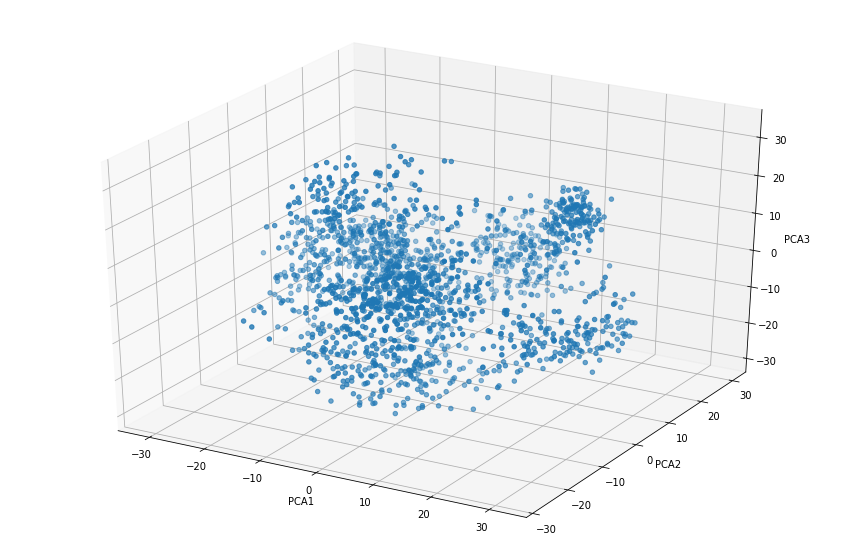

In [24]:
fig = plt.figure()
plt.figure(figsize=(15, 10))
ax = plt.axes(projection='3d')
ax.scatter3D(principalComponents_3[:,0], principalComponents_3[:,1], principalComponents_3[:,2])
ax.set_xlabel('PCA1')
ax.set_ylabel('PCA2')
ax.set_zlabel('PCA3')
plt.show();

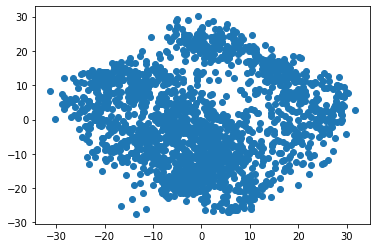

In [25]:
plt.scatter(principalComponents_3[:,0], principalComponents_3[:,1]);

#### Linear Discriminant Analysis | LDA

In [26]:
# Create and run an LDA, then use it to transform the features
lda = LinearDiscriminantAnalysis(n_components=10)
X_lda = lda.fit(X, y).transform(X)

# Print the number of features
print("Original number of features:", X.shape[1])
print("Reduced number of features:", X_lda.shape[1])

Original number of features: 64
Reduced number of features: 9


In [27]:
lda_var_ratios = lda.explained_variance_ratio_
print(lda_var_ratios)
print ("\n Explained variance Ratio: ", np.sum(lda_var_ratios))

[0.28912041 0.18262788 0.16962345 0.1167055  0.08301253 0.06565685
 0.04310127 0.0293257  0.0208264 ]

 Explained variance Ratio:  0.9999999999999999


In [28]:
def select_n_components(var_ratio, goal_var: float) -> int:
    total_variance = 0.0
    n_components = 0
    # For the explained variance of each feature:
    for explained_variance in var_ratio:
        total_variance += explained_variance
        n_components += 1
        if total_variance >= goal_var:
            break
    return n_components

select_n_components(lda_var_ratios, 0.99)

9

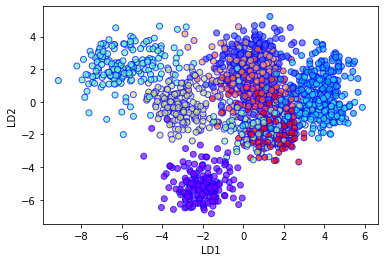

In [29]:
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.scatter(
    X_lda[:,0],
    X_lda[:,1],
    c=y,
    cmap='rainbow',
    alpha=0.7,
    edgecolors='b'
)
plt.show()

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X_lda, y, random_state=1)

In [31]:
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
confusion_matrix(y_test, y_pred)

array([[52,  0,  0,  0,  0,  0,  1,  0,  0,  0],
       [ 0, 41,  0,  0,  0,  0,  0,  0,  1,  0],
       [ 0,  0, 41,  0,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  1, 50,  0,  0,  0,  0,  1,  0],
       [ 0,  0,  0,  0, 47,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0, 37,  0,  0,  0,  2],
       [ 0,  0,  0,  0,  0,  0, 43,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 46,  1,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0, 36,  1],
       [ 0,  0,  0,  0,  0,  0,  0,  0,  0, 48]])

In [32]:
testModel(X_test,y_test, clf)

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        53
           1       1.00      0.98      0.99        42
           2       0.98      1.00      0.99        41
           3       1.00      0.96      0.98        52
           4       1.00      1.00      1.00        47
           5       1.00      0.95      0.97        39
           6       0.98      1.00      0.99        43
           7       1.00      0.96      0.98        48
           8       0.92      0.97      0.95        37
           9       0.92      1.00      0.96        48

    accuracy                           0.98       450
   macro avg       0.98      0.98      0.98       450
weighted avg       0.98      0.98      0.98       450

Accuracy:  0.98 %


### 🤴👸 Hierarchical Clusterization

### Before PCA / LDA:

In [33]:
#Ex1 Build a dendrogram for a this dataset
mergings = linkage(X, method='single')

In [34]:
X.shape

(1797, 64)

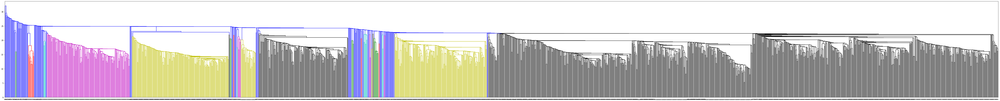

In [37]:
plt.figure(figsize=(100, 10))  
dendrogram(mergings,
           labels=y,
           leaf_rotation=90,
           leaf_font_size=10
)

plt.show()

In [38]:
cluster1 = AgglomerativeClustering(n_clusters=9, affinity='euclidean', linkage='single')  
y_predict1 = cluster1.fit_predict(X)

### After PCA / LDA:

#### * PCA

In [39]:
#Building a dendrogram for a PCA dataset
mergings2 = linkage(pca_data, method='average')

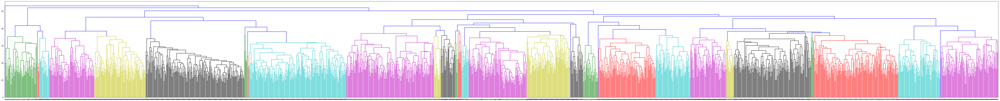

In [40]:
plt.figure(figsize=(100, 10))  
dendrogram(mergings2,
           labels=y,
           leaf_rotation=90,
           leaf_font_size=10
)

plt.show()

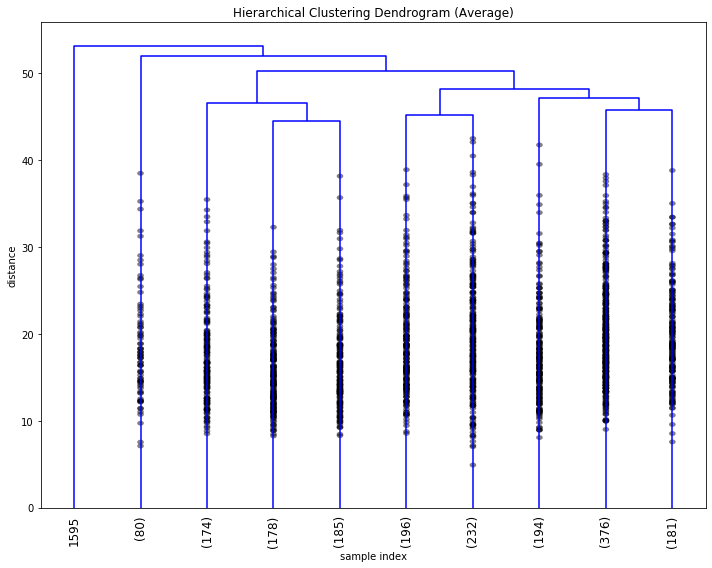

In [41]:
_=plt.figure(figsize=(10, 8))
dendrogram(
    mergings2,
    #color_threshold=4,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=10,  # show only the last p merged clusters
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
_=plt.title('Hierarchical Clustering Dendrogram (Average)')
_=plt.xlabel('sample index')
_=plt.ylabel('distance')
_=plt.tight_layout()

## 🌌 Clusterization Techniques
* Kmeans
* Agglomerative Clustering
* MiniBatchKmeans
* Birch

### SILHOUETTE & ELBOW methods: let's find the optimal number of clusters for our data

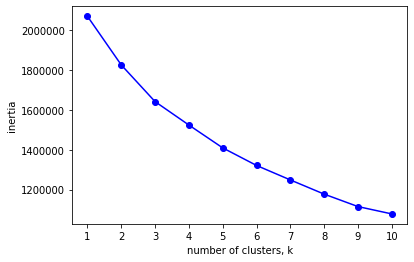

In [35]:
# ELBOW
ks = range(1, 11)
inertias = []
for k in ks:
    model = KMeans(n_clusters=k, random_state=42)
    model.fit(pca_data)
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='blue')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

In [36]:
# SILHOUETTE
silhouette = []
list_k_sil = list(range(2, 11))

for k in list_k_sil:
    kmeans = KMeans(n_clusters=k)
    preds = kmeans.fit_predict(pca_data)
    centers = kmeans.cluster_centers_
    score = silhouette_score(X, preds)
    silhouette.append(score)


Text(0, 0.5, 'Average silhouette width')

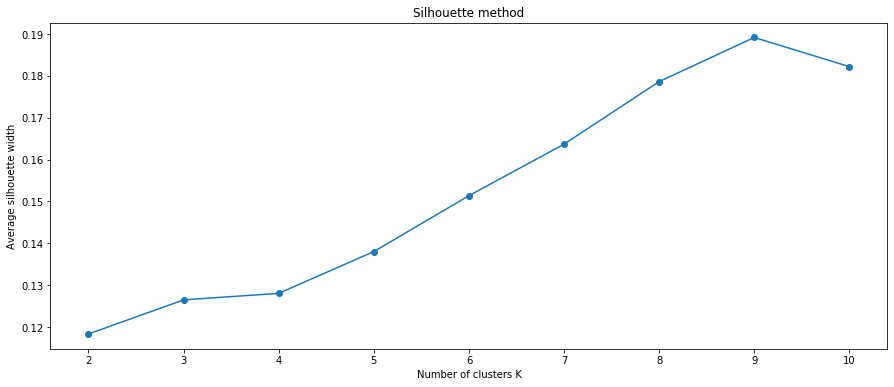

In [37]:
plt.figure(figsize=(15, 6))
plt.plot(list_k_sil, silhouette, '-o')
plt.title("Silhouette method")
plt.xlabel(r'Number of clusters K')
plt.ylabel('Average silhouette width')


### K-means:

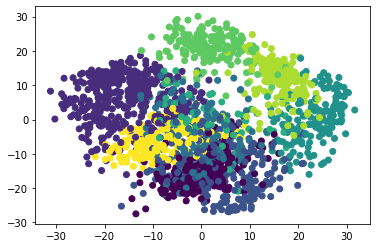

In [38]:
t1 = time.time()

#### With PCA:
kmeans_model = KMeans(n_clusters=9, random_state=1).fit(pca_data)
labels_kmeans = kmeans_model.labels_

labels_kmeans = kmeans_model.fit_predict(pca_data)
plt.scatter(pca_data[:, 0], pca_data[:, 1], c=labels_kmeans);


#### With LDA:
#kmeans_model = KMeans(n_clusters=9, random_state=1).fit(X_lda)
#labels_kmeans_lda = kmeans_model.labels_
#
#labels_kmeans_lda = kmeans_model.fit_predict(X_lda)
#plt.scatter(X_lda[:, 0], X_lda[:, 1], c=labels_kmeans_lda);

<Figure size 432x288 with 0 Axes>

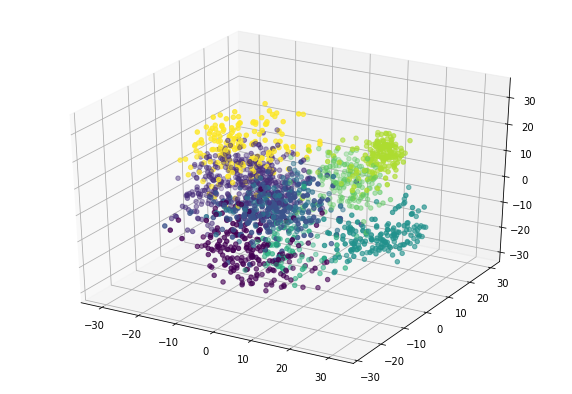

In [39]:
fig = plt.figure()
plt.figure(figsize=(10, 7))
ax = plt.axes(projection='3d')
ax.scatter3D(pca_data[:,0], pca_data[:,1], pca_data[:,2], c=labels_kmeans);

### Converting PCAs into a DF to plot the radius.

In [40]:
principalDf = pd.DataFrame(data = pca_data , columns = ['principal_component_1',
                                                        'principal_component_2',
                                                        'principal_component_3',
                                                        'principal_component_4',
                                                        'principal_component_5',
                                                        'principal_component_6',
                                                        'principal_component_7',
                                                        'principal_component_8',
                                                        'principal_component_9',
                                                        'principal_component_10',
                                                        'principal_component_11',
                                                        'principal_component_12',
                                                        'principal_component_13',
                                                        'principal_component_14',
                                                        'principal_component_15',
                                                        'principal_component_16',
                                                        'principal_component_17',
                                                        'principal_component_18',
                                                        'principal_component_19',
                                                        'principal_component_20',
                                                        'principal_component_21',
                                                        'principal_component_22',
                                                        'principal_component_23',
                                                        'principal_component_24',
                                                        'principal_component_25',
                                                        'principal_component_26',
                                                        'principal_component_27',
                                                        'principal_component_28',
                                                        'principal_component_29',
                                                        'principal_component_30']) 
principalDf.head()

,principal_component_1,principal_component_2,principal_component_3,principal_component_4,principal_component_5,principal_component_6,principal_component_7,principal_component_8,principal_component_9,principal_component_10,...,principal_component_21,principal_component_22,principal_component_23,principal_component_24,principal_component_25,principal_component_26,principal_component_27,principal_component_28,principal_component_29,principal_component_30
0,-1.259466,21.274883,-9.463055,13.014189,-7.128823,-7.440659,3.252837,2.553470,-0.581842,3.625698,...,2.682058,1.010705,2.009639,1.297489,1.184200,2.298734,3.667179,-0.981106,-1.134660,2.346275
1,7.957611,-20.768699,4.439506,-14.893664,5.896249,-6.485622,2.126228,-4.615936,3.587450,-1.074706,...,-1.205640,-4.840052,0.858700,-2.974595,5.286873,0.117158,2.179120,-0.503273,2.305422,0.767705
2,6.991923,-9.955986,2.958558,-12.288302,-18.126023,-4.507664,1.843123,-16.415200,0.719233,4.255805,...,4.950188,-2.466256,5.999878,0.104417,-3.065284,0.163016,4.234002,2.182581,0.847070,-0.536149
3,-15.906105,3.332464,9.824372,-12.275838,6.965169,1.089483,-1.042085,10.973557,-3.259736,6.498749,...,0.268659,3.621124,2.537354,-1.355746,-1.746208,-1.338849,-5.849144,4.725633,-1.129797,2.861714
4,23.306867,4.269061,-5.675129,-13.851524,-0.358124,-2.857574,-0.720497,13.041696,-3.835412,13.414166,...,0.207415,5.743066,-7.610166,3.992582,2.788192,-0.164088,0.484713,0.589914,-3.285940,-0.407383


In [41]:
def plot_kmeans(kmeans, X, n_clusters=4, rseed=0, ax=None):
    labels = kmeans.fit_predict(X)

    # plot the input X
    ax = ax or plt.gca()
    ax.axis('equal')
    ax.scatter(X['principal_component_1'], X['principal_component_2'], c=labels, s=40, cmap='viridis', zorder=2)

    # plot the representation of the k-means model
    centers = kmeans.cluster_centers_
    radii = [cdist(X[labels == i], [center]).max()
             for i, center in enumerate(centers)]
    for c, r in zip(centers, radii):
        ax.add_patch(plt.Circle(c, r, fc='#CCCCCC', lw=3, alpha=0.5, zorder=1))

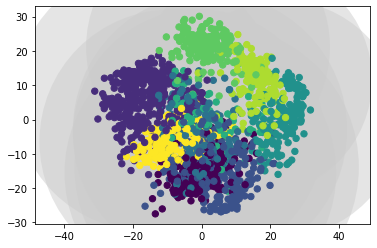

In [42]:
plot_kmeans(kmeans_model, principalDf)

#### Agglomerative Clustering (*linkage='average*')

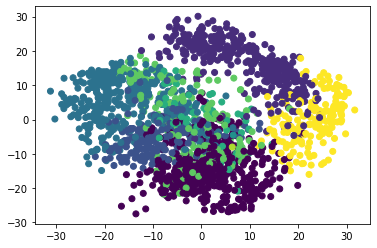

In [43]:
t2 = time.time()

agg_model = AgglomerativeClustering(n_clusters=9, affinity='euclidean', linkage='average') #You can try different linkages: complete, single, ward
labels_agg = agg_model.fit_predict(pca_data)

labels_agg = agg_model.fit_predict(pca_data)
plt.scatter(pca_data[:, 0], pca_data[:, 1], c=labels_agg);

<Figure size 432x288 with 0 Axes>

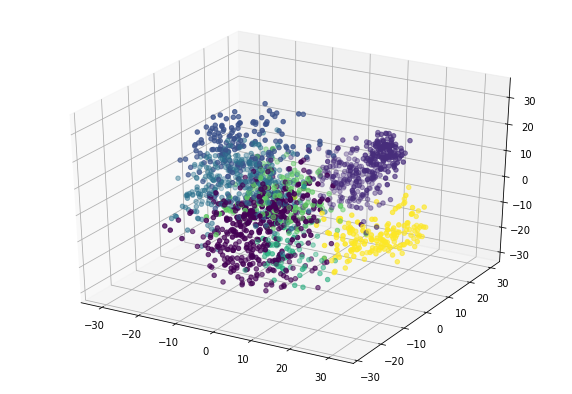

In [44]:
fig = plt.figure()
plt.figure(figsize=(10, 7))
ax = plt.axes(projection='3d')
ax.scatter3D(pca_data[:,0], pca_data[:,1], pca_data[:,2], c=labels_agg);

#### MiniBatchKmeans

In [59]:
t3 = time.time()

mini_batch_kmeans_model = MiniBatchKMeans(n_clusters=9, random_state=1, batch_size=100).fit(pca_data)
# Train model
labels_mini_batch_kmeans = mini_batch_kmeans_model.labels_


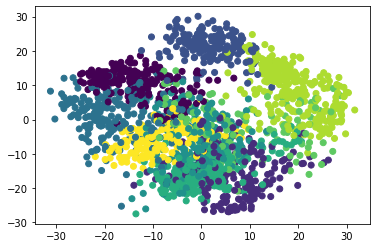

In [60]:
plt.scatter(pca_data[:, 0], pca_data[:, 1], c=labels_mini_batch_kmeans);

#### Birch

In [47]:
t4 = time.time()

brc_02 = Birch(branching_factor=2, n_clusters=None, threshold=1.5)
brc_02.fit(pca_data)


t5 = time.time()

brc_50 = Birch(branching_factor=50, n_clusters=None, threshold=1.5)
brc_50.fit(pca_data)

Birch(branching_factor=50, compute_labels=True, copy=True, n_clusters=None,
      threshold=1.5)

In [48]:
labels_02 = brc_02.predict(pca_data)
labels_50 = brc_50.predict(pca_data)

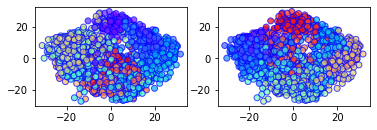

In [49]:
plt.subplot(2,2,1)
plt.scatter(pca_data[:,0], pca_data[:,1], c=labels_02, cmap='rainbow', alpha=0.7, edgecolors='b')

plt.subplot(2,2,2)
plt.scatter(pca_data[:,0], pca_data[:,1], c=labels_50, cmap='rainbow', alpha=0.7, edgecolors='b')

### Density Estimation 
* DB-SCAN
* OPTICS

#### DB-SCAN

In [50]:
t6 = time.time()

db = DBSCAN(eps=2, min_samples=1).fit(pca_data)
labels_dbscan = db.labels_
n_clusters_ = len(set(labels_dbscan)) - (1 if -1 in labels_dbscan else 0)
n_noise_ = list(labels_dbscan).count(-1)
print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)

Estimated number of clusters: 1797
Estimated number of noise points: 0


<Figure size 432x288 with 0 Axes>

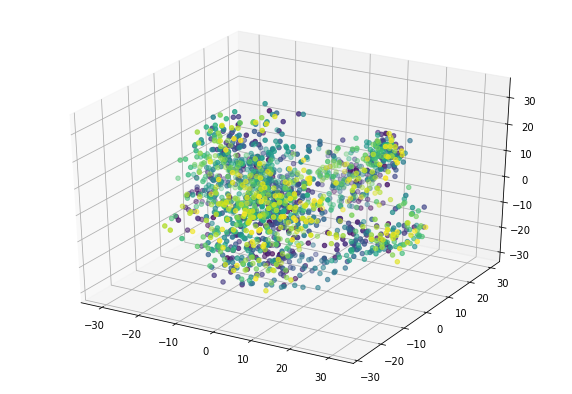

In [51]:
fig = plt.figure()
plt.figure(figsize=(10, 7))
ax = plt.axes(projection='3d')
ax.scatter3D(pca_data[:,0], pca_data[:,1], pca_data[:,2], c=labels_dbscan);

#### OPTICS

In [52]:
t7 = time.time()

optics_model = OPTICS(min_samples=2,eps=2).fit(pca_data)
labels_optics = optics_model.labels_

<Figure size 432x288 with 0 Axes>

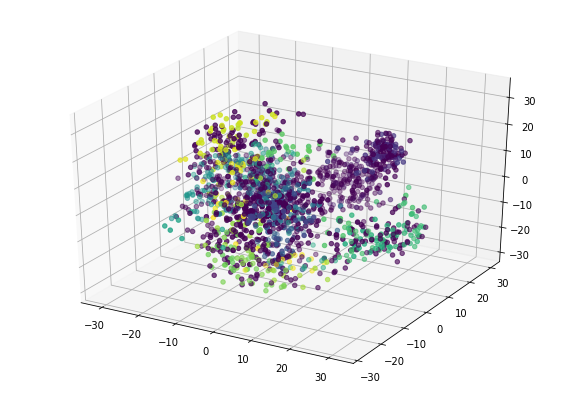

In [53]:
fig = plt.figure()
plt.figure(figsize=(10, 7))
ax = plt.axes(projection='3d')
ax.scatter3D(pca_data[:,0], pca_data[:,1], pca_data[:,2], c=labels_optics);

Text(0.5, 1.0, 'Automatic Clustering\nOPTICS')

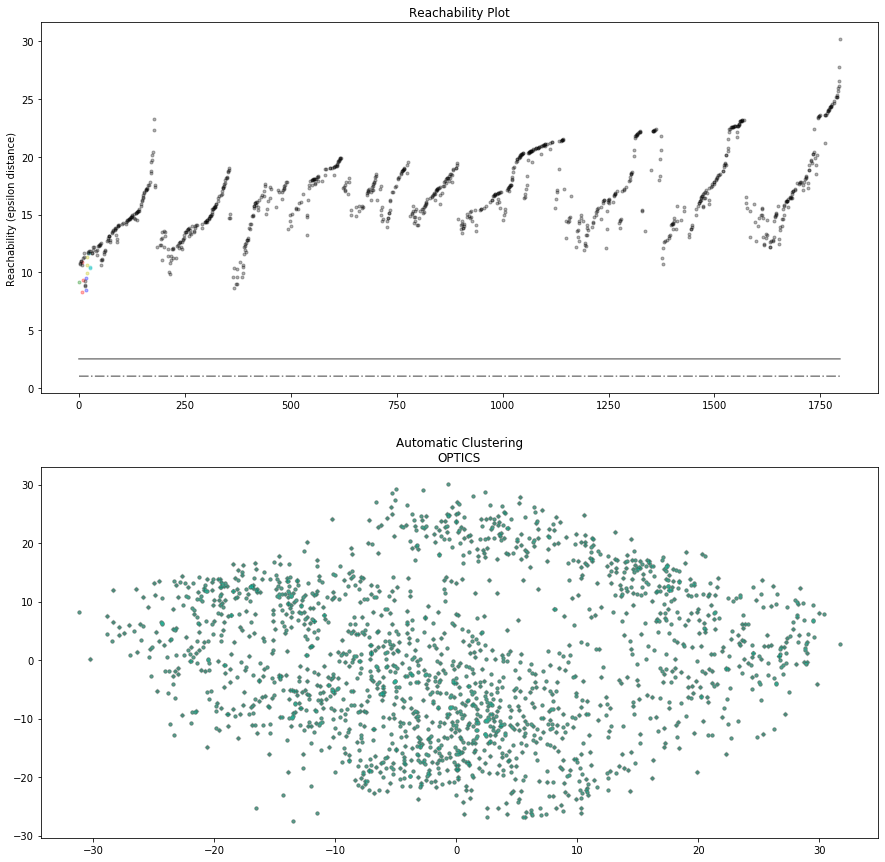

In [54]:
space = np.arange(len(pca_data))
reachability = optics_model.reachability_[optics_model.ordering_]
labels = optics_model.labels_[optics_model.ordering_]


plt.figure(figsize=(15, 15))
G = gridspec.GridSpec(2, 1)
ax1 = plt.subplot(G[0, :])
ax2 = plt.subplot(G[1, :])


# Reachability plot
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = space[labels == klass]
    Rk = reachability[labels == klass]
    ax1.plot(Xk, Rk, color, alpha=0.3)
ax1.plot(space[labels == -1], reachability[labels == -1], 'k.', alpha=0.3)
ax1.plot(space, np.full_like(space, 2.5, dtype=float), 'k-', alpha=0.5)
ax1.plot(space, np.full_like(space, 1., dtype=float), 'k-.', alpha=0.5)
ax1.set_ylabel('Reachability (epsilon distance)')
ax1.set_title('Reachability Plot')

# OPTICS
colors = ['g.', 'r.', 'b.', 'y.', 'c.']
for klass, color in zip(range(0, 5), colors):
    Xk = pca_data[optics_model.labels_ == klass]
    ax2.plot(principalComponents_3[:, 0], principalComponents_3[:, 1], color, alpha=0.3)
ax2.plot(pca_data[optics_model.labels_ == -1, 0], pca_data[optics_model.labels_ == -1, 1], 'k+', alpha=0.1)
ax2.set_title('Automatic Clustering\nOPTICS')


In [55]:
labels_01 = cluster_optics_dbscan(reachability=optics_model.reachability_,
                                   core_distances=optics_model.core_distances_,
                                   ordering=optics_model.ordering_, eps=1)

# labels_01

Text(0, 0.5, 'Y')

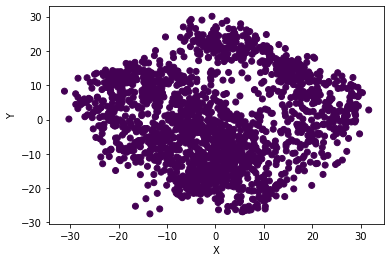

In [56]:
plt.scatter(principalComponents_3[:,0], principalComponents_3[:,1], c=labels_01)
plt.xlabel('X')
plt.ylabel('Y')

### ⚖️ Performance Comparison

In [57]:
res = [("Kmeans_model_pca_09", labels_kmeans, t1),
       ("Agg_average_linkage",labels_agg, t2),
       ("Mini-batch Kmeans", labels_mini_batch_kmeans, t3),
       ("Birch_02", labels_02, t4),
       ("Birch_50", labels_50, t5),
       ("DBSCAN",labels_dbscan, t6),
       ("Labels_optics", labels_01, t7)    
       ]


In [58]:
for r in res:
    print(r[0])
    print("Time execution:", round((time.time() - r[2]), 2))
    print("Homogeneity: %0.3f" % metrics.homogeneity_score(y, r[1]))
    print("Completeness: %0.3f" % metrics.completeness_score(y, r[1]))
    print("V-measure: %0.3f" % metrics.v_measure_score(y, r[1]))
    print("Adjusted Rand Index: %0.3f" % metrics.adjusted_rand_score(y, r[1]))
    print("Adjusted Mutual Information: %0.3f"% metrics.adjusted_mutual_info_score(y, r[1]))
    print("==========================")

Kmeans_model_pca_09
Time execution: 85.89
Homogeneity: 0.692
Completeness: 0.750
V-measure: 0.719
Adjusted Rand Index: 0.597
Adjusted Mutual Information: 0.717
Agg_average_linkage
Time execution: 71.73
Homogeneity: 0.642
Completeness: 0.806
V-measure: 0.715
Adjusted Rand Index: 0.529
Adjusted Mutual Information: 0.712
Mini-batch Kmeans
Time execution: 62.28
Homogeneity: 0.252
Completeness: 0.531
V-measure: 0.342
Adjusted Rand Index: 0.196
Adjusted Mutual Information: 0.340
Birch_02
Time execution: 48.45
Homogeneity: 1.000
Completeness: 0.307
V-measure: 0.470
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000
Birch_50
Time execution: 40.22
Homogeneity: 1.000
Completeness: 0.307
V-measure: 0.470
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000
DBSCAN
Time execution: 31.31
Homogeneity: 1.000
Completeness: 0.307
V-measure: 0.470
Adjusted Rand Index: 0.000
Adjusted Mutual Information: -0.000
Labels_optics
Time execution: 27.09
Homogeneity: 0.000
Completeness: 1.000